In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import cv2
import os

# Global variables
SAVE = False
SEED = 111

# Setting seed for consistent results
tf.keras.utils.set_random_seed(SEED)
tf.random.set_seed(SEED)
np.random.seed(SEED)

2024-06-02 10:40:07.875575: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-02 10:40:07.875677: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-02 10:40:07.990149: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
print("--> Checking for physical Tensorflow devices")
for device in tf.config.list_physical_devices():
    print(": {}".format(device.name))

--> Checking for physical Tensorflow devices
: /physical_device:CPU:0
: /physical_device:GPU:0
: /physical_device:GPU:1


# 1. Data Processing

Data comes from kaggle. Here's the link to dataset website: https://www.kaggle.com/datasets/masoudnickparvar/brain-tumor-mri-dataset/data.

This notebook is originally run on kaggle website, so original data are in '/kaggle/input/brain-tumor-mri-dataset' directory.

The data are already split into Training and Testing directories in which every class has its own directory.

Input data of my model will be numpy arrays of shape (256, 256,1) and output data will be one of 4 categories (glioma, meningioma, notumor, pituitary).

## 1.1 Raw Data Sizes

According to the creator of the dataset some images have different sizes, so first I check it and resize them.

I check how many images in every directory have different shapes than (512,512) or (512,512,3). If image has more than 2 dimentions it has the same picture in every channel.

In [3]:
# Cleaning the /kaggle/working directory
!rm -rf /kaggle/working/*

(512, 512)


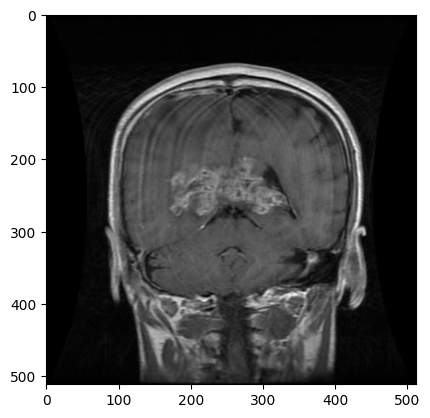

In [4]:
im = plt.imread('/kaggle/input/brain-tumor-mri-dataset/Testing/glioma/Te-gl_0250.jpg')
print(im.shape)
plt.imshow(im, cmap='gray')
plt.show()

In [5]:
def get_image_sizes(root_dir):
    image_sizes = []
    small_image_sizes = []

    # Traverse the directory tree
    for dirpath, _, filenames in os.walk(root_dir):
        all_images = 0
        small_images = 0
        for filename in filenames:
            all_images += 1
            # Construct the full file path
            file_path = os.path.join(dirpath, filename)
            
            # Try to open and process the image
            try:
                img = plt.imread(file_path)
                # Convert the image to a numpy array
                img_array = np.array(img)

                # Get the shape of the numpy array
                img_shape = img_array.shape
                
                image_sizes.append((file_path, img_shape))

                if img_shape not in ((512, 512), (512,512,3)):
                # Append the shape to the list
                    small_image_sizes.append((file_path, img_shape))
                    small_images += 1
                    
            except Exception as e:
                print(f"Could not process {file_path}: {e}")
        if dirpath != root_dir: 
            print(f'{dirpath}: {small_images}/{all_images}')

    return small_image_sizes, image_sizes

In [6]:
# Specify the root directory containing the images
root_directory_train = '/kaggle/input/brain-tumor-mri-dataset/Training'
root_directory_test = '/kaggle/input/brain-tumor-mri-dataset/Testing'

# Get the image sizes
diff_train_sizes, train_sizes = get_image_sizes(root_directory_train)
diff_test_sizes, test_sizes = get_image_sizes(root_directory_test)

print(f'Count of train images with shape different than (512,512) or (512,512,3): {len(diff_train_sizes)}/{len(train_sizes)}')
print(f'Count of test images with shape different than (512,512) or (512,512,3): {len(diff_test_sizes)}/{len(test_sizes)}')

/kaggle/input/brain-tumor-mri-dataset/Training/pituitary: 39/1457
/kaggle/input/brain-tumor-mri-dataset/Training/notumor: 1578/1595
/kaggle/input/brain-tumor-mri-dataset/Training/meningioma: 140/1339
/kaggle/input/brain-tumor-mri-dataset/Training/glioma: 0/1321
/kaggle/input/brain-tumor-mri-dataset/Testing/pituitary: 4/300
/kaggle/input/brain-tumor-mri-dataset/Testing/notumor: 402/405
/kaggle/input/brain-tumor-mri-dataset/Testing/meningioma: 118/306
/kaggle/input/brain-tumor-mri-dataset/Testing/glioma: 0/300
Count of train images with shape different than (512,512) or (512,512,3): 1757/5712
Count of test images with shape different than (512,512) or (512,512,3): 524/1311


## 1.2 Data Reshaping

In [7]:
def find_brain_contour(img):
    # Convert image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Apply GaussianBlur to reduce noise and improve contour detection
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    
    # Use Canny edge detection
    edges = cv2.Canny(blurred, 45, 255)
    edges = cv2.threshold(blurred, 45, 255, cv2.THRESH_BINARY)[1]
    edges = cv2.erode(edges, None, iterations=2)
    edges = cv2.dilate(edges, None, iterations=2)
    
    # Find contours
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Find the largest contour which will be assumed to be the brain
    if contours:
        brain_contour = max(contours, key=cv2.contourArea)
        return brain_contour
    else:
        return None

def resize_images(root_dir, output_dir, target_shape):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    for dirpath, dirs, filenames in os.walk(root_dir):
        for filename in filenames:
            dir_name = os.path.basename(os.path.normpath(dirpath))
            file_path = os.path.join(dirpath, filename)
            output_path = os.path.join(output_dir, dir_name, filename)
            if not os.path.exists(os.path.join(output_dir, dir_name)):
                os.makedirs(os.path.join(output_dir, dir_name))
            
            # Try to open and process the image
            try:
                img = cv2.imread(file_path)
                if img is None:
                    print(f"Could not read {file_path}")
                    continue
                
                brain_contour = find_brain_contour(img)
                if brain_contour is None:
                    print(f"No contours found in {file_path}")
                    continue
                
                # Get bounding box of the contour
                x, y, w, h = cv2.boundingRect(brain_contour)
                
                # Crop the brain region
                brain_region = img[y:y+h, x:x+w]
                
                # Resize to target shape
                resized_brain = cv2.resize(brain_region, target_shape)
                
                # Save the processed image
                cv2.imwrite(output_path, resized_brain)
#                 print(f"Processed and saved: {output_path}")
                
            except Exception as e:
                print(f"Could not process {file_path}: {e}")


In [8]:
%%time
# Specify the root directory containing the images
train_root_directory = '/kaggle/input/brain-tumor-mri-dataset/Training'
test_root_directory = '/kaggle/input/brain-tumor-mri-dataset/Testing'

# Specify the output directory for the processed images
train_resized_directory = '/kaggle/working/resized_256/Training'
test_resized_directory = '/kaggle/working/resized_256/Testing'

# Specify the target shape (width, height) for resizing
image_dim = (256, 256)

# Process the images
resize_images(train_root_directory, train_resized_directory, image_dim)
resize_images(test_root_directory, test_resized_directory, image_dim)

CPU times: user 1min 10s, sys: 27.5 s, total: 1min 38s
Wall time: 49.4 s


## 1.3 Data Visualization

In [9]:
def paths_and_labels(root_dir):
    paths = []
    labels = []
    for dirpath, _, filenames in os.walk(root_dir):
        for filename in filenames:
            paths.append(os.path.join(dirpath, filename))
            labels.append(os.path.basename(os.path.normpath(dirpath)))
    return pd.DataFrame({'path':paths, 'label':labels})
            

                                                path      label
0  /kaggle/working/resized_256/Training/pituitary...  pituitary
1  /kaggle/working/resized_256/Training/pituitary...  pituitary
2  /kaggle/working/resized_256/Training/pituitary...  pituitary
3  /kaggle/working/resized_256/Training/pituitary...  pituitary
4  /kaggle/working/resized_256/Training/pituitary...  pituitary
                                                path      label
0  /kaggle/working/resized_256/Testing/pituitary/...  pituitary
1  /kaggle/working/resized_256/Testing/pituitary/...  pituitary
2  /kaggle/working/resized_256/Testing/pituitary/...  pituitary
3  /kaggle/working/resized_256/Testing/pituitary/...  pituitary
4  /kaggle/working/resized_256/Testing/pituitary/...  pituitary


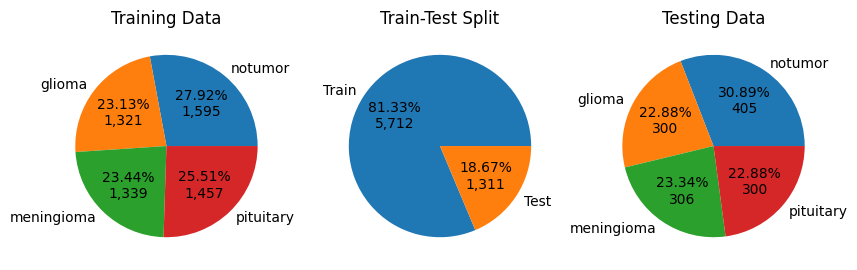

In [10]:
train_df = paths_and_labels(train_resized_directory)
test_df = paths_and_labels(test_resized_directory)
class_map = {'notumor':0,'glioma':1,'meningioma':2, 'pituitary':3}
class_names = class_map.keys()

print(train_df.head())
print(test_df.head())

fig, axs = plt.subplots(1,3,figsize=(10,10))
class_counts = [len([x for x in train_df.label if x == label]) for label in class_names]
axs[0].set_title('Training Data')
axs[0].pie(class_counts,
          labels=class_names,
          autopct=lambda p: '{:.2f}%\n{:,.0f}'.format(p, p * sum(class_counts) / 100))

axs[1].set_title('Train-Test Split')
axs[1].pie([len(train_df.label), len(test_df.label)],
          labels=['Train', 'Test'],
          autopct=lambda p: '{:.2f}%\n{:,.0f}'.format(p, p * sum([len(train_df.label), len(test_df.label)]) / 100))


class_counts = [len([x for x in test_df.label if x == label]) for label in class_names]
axs[2].set_title('Testing Data')
axs[2].pie(class_counts,
          labels=class_names,
          autopct=lambda p: '{:.2f}%\n{:,.0f}'.format(p, p * sum(class_counts) / 100))



plt.show()

In [11]:
def show_images(df, n_examples=3, suptitle=''):
    fig, axs = plt.subplots(n_examples, len(class_names), figsize=(12,8))
    for i, class_name in enumerate(class_names):
        df_example = df[df.label == class_name].sample(n=n_examples)
        axs[0,i].set_title(class_name)
        for j, example in enumerate(df_example.path):
            axs[j,i].imshow(plt.imread(example), cmap='gray')
    plt.suptitle(suptitle)
    plt.tight_layout()
    plt.show()

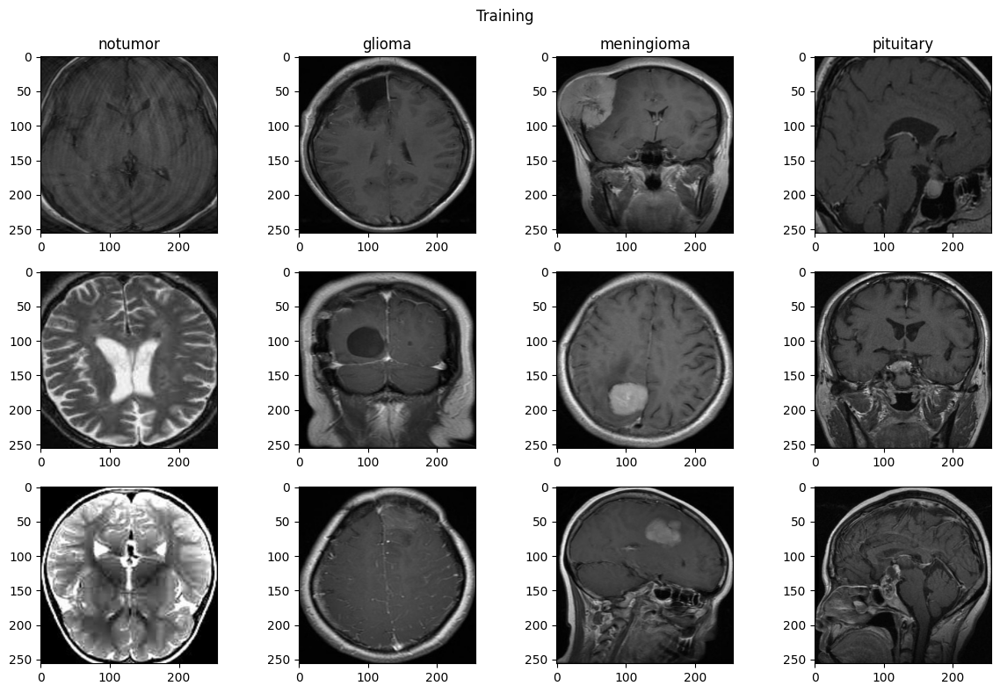

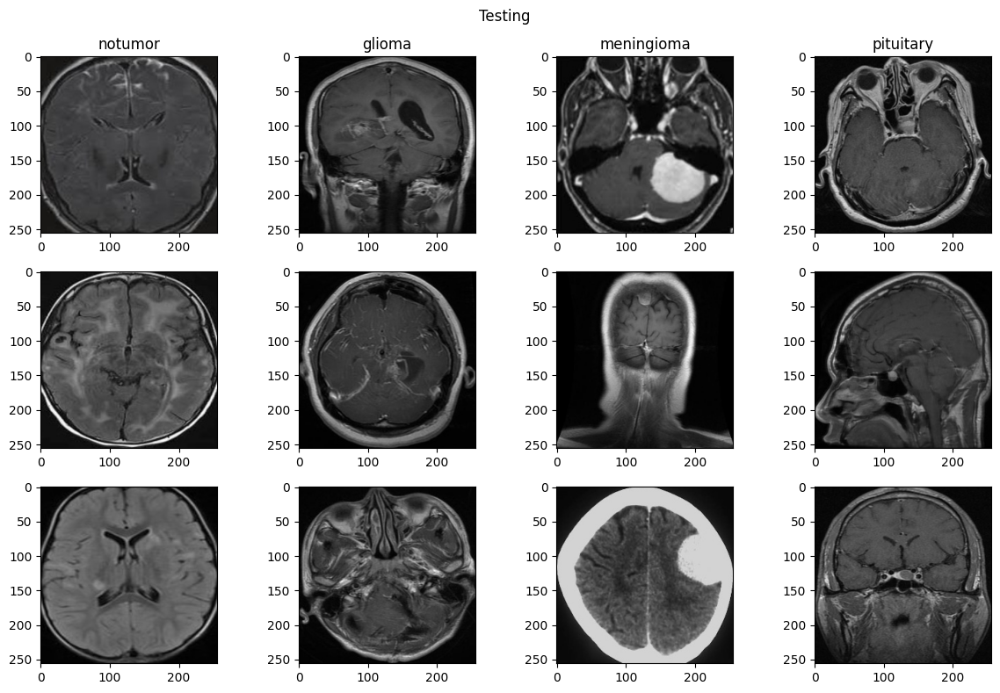

In [12]:
show_images(train_df, 3, 'Training')
show_images(test_df, 3, 'Testing')

## 1.4 Data Augmetation

In [13]:
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.preprocessing.image import ImageDataGenerator

batch_size = 32

train_valid_gen = ImageDataGenerator(rescale=1/255,
                                     validation_split=0.05,
                                     horizontal_flip=True,
                                     rotation_range=0.1,
                                     brightness_range=(0.8, 1.2),
                                     fill_mode='constant')


train_gen = train_valid_gen.flow_from_dataframe(train_df,
                                                x_col='path', y_col='label',
                                                batch_size=batch_size,
                                                target_size=image_dim,
                                                class_mode='categorical',
                                                color_mode='grayscale',
                                                subset='training'
                                               )


valid_gen = train_valid_gen.flow_from_dataframe(train_df,
                                                x_col='path', y_col='label',
                                                batch_size=batch_size,
                                                target_size=image_dim,
                                                class_mode='categorical',
                                                color_mode='grayscale',
                                                subset='validation'
                                               )


ds_test = image_dataset_from_directory(test_resized_directory,
                                       label_mode='categorical',
                                       color_mode='grayscale',
                                       batch_size=batch_size,
                                       image_size=image_dim,
                                       seed=SEED,
                                      )


def normalization_from_0_to_1(image, label):
    return image / 255, label

ds_test_norm = ds_test.map(normalization_from_0_to_1)
ds_test_norm.class_names = ds_test.class_names

STEP_SIZE_TRAIN=train_gen.n//train_gen.batch_size
STEP_SIZE_VALID=valid_gen.n//valid_gen.batch_size
STEP_SIZE_TEST=ds_test.cardinality().numpy()
print(f'---Step size---\ntrain: {STEP_SIZE_TRAIN}\nvalid: {STEP_SIZE_VALID}\ntest: {STEP_SIZE_TEST}')

Found 5427 validated image filenames belonging to 4 classes.
Found 285 validated image filenames belonging to 4 classes.
Found 1311 files belonging to 4 classes.
---Step size---
train: 169
valid: 8
test: 41


In [14]:
print('Test dataset:',ds_test.class_names)
print('Train generatot:',train_gen.class_indices)
print('Valid generator:',valid_gen.class_indices)

Test dataset: ['glioma', 'meningioma', 'notumor', 'pituitary']
Train generatot: {'glioma': 0, 'meningioma': 1, 'notumor': 2, 'pituitary': 3}
Valid generator: {'glioma': 0, 'meningioma': 1, 'notumor': 2, 'pituitary': 3}


In [15]:
for gen in (train_gen, valid_gen, ds_test):
    item = next(iter(gen))
    print('Shapes of data:',item[0].shape, item[1].shape)
    print('Label example:',item[1][0])

Shapes of data: (32, 256, 256, 1) (32, 4)
Label example: [0. 0. 1. 0.]
Shapes of data: (32, 256, 256, 1) (32, 4)
Label example: [0. 0. 0. 1.]
Shapes of data: (32, 256, 256, 1) (32, 4)
Label example: tf.Tensor([0. 0. 1. 0.], shape=(4,), dtype=float32)


In [16]:
def show_images_from_generator(gen, gen_name=''):
    class_dict = gen.class_indices
    classes = list(class_dict.keys())
    images, labels = next(gen)

    plt.figure(figsize=(20, 20))

    for i, (image, label) in enumerate(zip(images, labels)):
        if i >= 16: break
        plt.subplot(4,4, i + 1)
        plt.imshow(image, cmap='gray')
        class_name = classes[np.argmax(label)]
        plt.title(class_name, color='k', fontsize=15)
    plt.suptitle(gen_name, fontsize=30)
    plt.tight_layout()
    plt.show()


def show_images_from_dataset(gen, gen_name=''):
    classes = gen.class_names
    images, labels = next(iter(gen))

    plt.figure(figsize=(20, 20))

    for i, (image, label) in enumerate(zip(images, labels)):
        if i >= 16: break
        plt.subplot(4,4, i + 1)
        plt.imshow(image, cmap='gray')
        class_name = classes[np.argmax(label)]
        plt.title(class_name, color='k', fontsize=15)
    plt.suptitle(gen_name, fontsize=30)
    plt.tight_layout()
    plt.show()

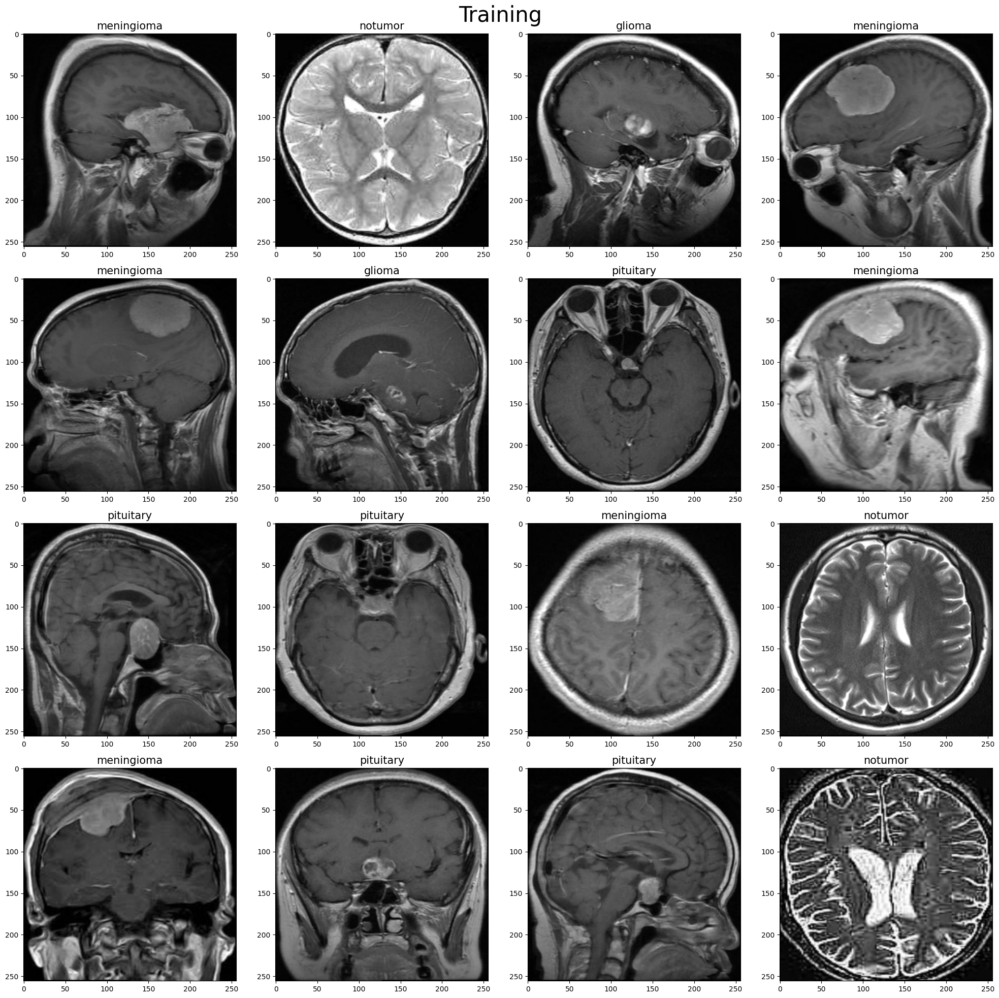

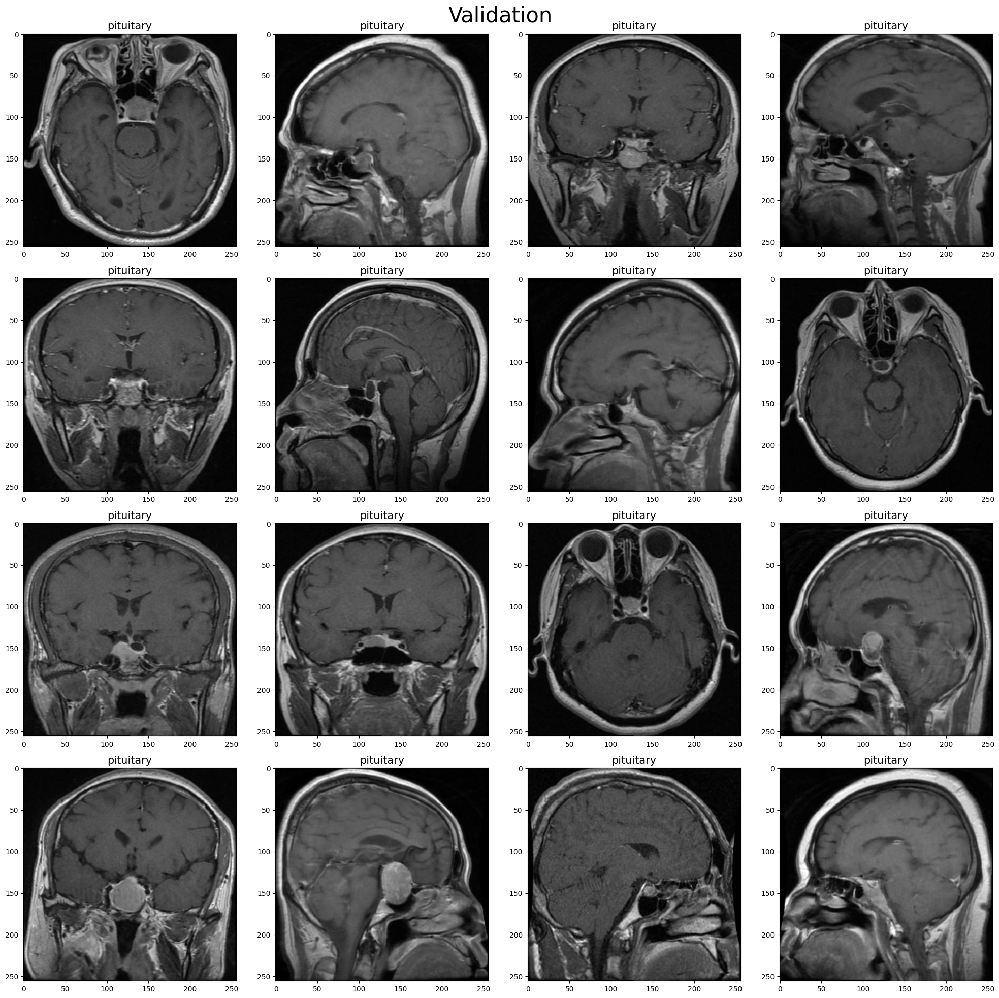

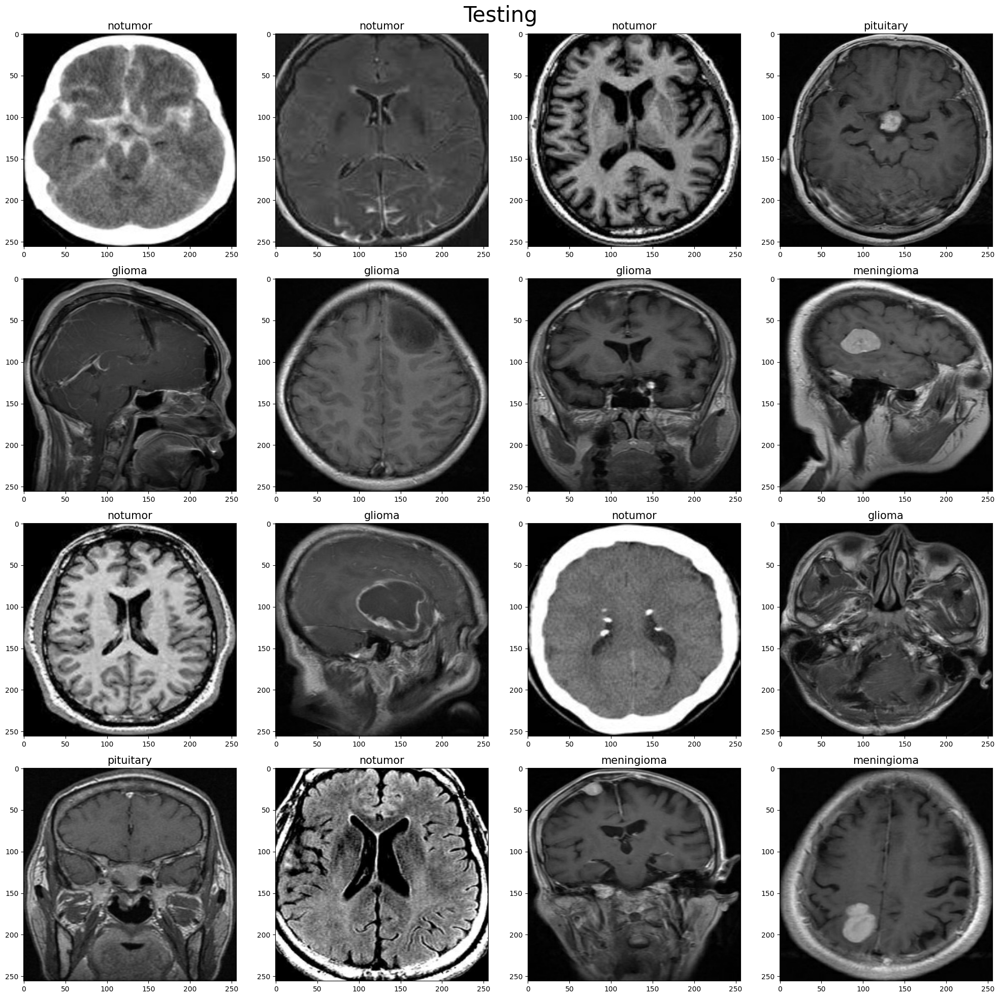

CPU times: user 13.8 s, sys: 934 ms, total: 14.7 s
Wall time: 13.2 s


In [17]:
%%time
with tf.device('/GPU:0'):
    show_images_from_generator(train_gen, 'Training')
    show_images_from_generator(valid_gen, 'Validation')
    show_images_from_dataset(ds_test, 'Testing')

# 2. Model definition

My model consists of 7 Conv2D layers and 7 MaxPooling2D alternately. At the end of it I add Flatten layer, Dense layer with ReLU activation function and Dense layer with Softmax activation function and 4 output neurons.

In [18]:
from tensorflow.keras.models import Sequential
from tensorflow.keras import Input
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout
from tensorflow.keras.optimizers.schedules import ExponentialDecay
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.metrics import CategoricalAccuracy, FalsePositives, FalseNegatives, F1Score, AUC

In [19]:
def plotTraining(history):
  fig, axes = plt.subplots(1,2, figsize=(25,10))
  fig.suptitle('Loss Function', fontsize=20)
  axes[0].plot(history.history['loss'], label='train')
  axes[0].plot(history.history['val_loss'], label='val')
  axes[0].set_xlabel('Epoch')
  axes[0].set_ylabel('Loss function')
  axes[0].legend(loc='upper right')

  axes[1].plot(history.history['loss'], label='train')
  axes[1].plot(history.history['val_loss'], label='val')
  axes[1].set_xlabel('Epoch')
  axes[1].set_ylabel('Loss function')
  axes[1].legend(loc='upper right')
  axes[1].set_yscale('log')

  plt.subplots_adjust(bottom=0.2, left=0.2, right=0.98, wspace=0.6)
  # plt.savefig('fig_png/')
  plt.show()

def plotTrainingAccuracy(history):
  fig, axes = plt.subplots(1,2, figsize=(25,10))
  fig.suptitle('Categorical Accuracy', fontsize=20)
  axes[0].plot(history.history['categorical_accuracy'], label='train')
  axes[0].plot(history.history['val_categorical_accuracy'], label='val')
  axes[0].set_xlabel('Epoch')
  axes[0].set_ylabel('Categorical Accuracy function')
  axes[0].legend(loc='upper right')

  axes[1].plot(history.history['categorical_accuracy'], label='train')
  axes[1].plot(history.history['val_categorical_accuracy'], label='val')
  axes[1].set_xlabel('Epoch')
  axes[1].set_ylabel('Categorical Accuracy function')
  axes[1].legend(loc='upper right')
  axes[1].set_yscale('log')

  plt.subplots_adjust(bottom=0.2, left=0.2, right=0.98, wspace=0.6)
  # plt.savefig('fig_png/')
  plt.show()

In [20]:
dirpath = '/kaggle/working/model'
if not os.path.exists(dirpath):
    os.makedirs(dirpath)
model_filepath = os.path.join(dirpath, 'model.keras')
image_shape = (*image_dim, 1)
print(image_shape)

(256, 256, 1)


In [21]:
model = Sequential(layers=[Input(shape=image_shape),
                           Conv2D(filters=64, kernel_size=3, strides=1, padding='same', activation='relu'),
                           MaxPooling2D(pool_size=(2,2), padding='same'),
                           Conv2D(filters=64, kernel_size=3, strides=1, padding='same', activation='relu'),
                           MaxPooling2D(pool_size=(2,2), padding='same'),
                           Conv2D(filters=64, kernel_size=3, strides=1, padding='same', activation='relu'),
                           MaxPooling2D(pool_size=(2,2), padding='same'),
                           Conv2D(filters=64, kernel_size=3, strides=1, padding='same', activation='relu'),
                           MaxPooling2D(pool_size=(2,2), padding='same'),
                           Conv2D(filters=64, kernel_size=3, strides=1, padding='same', activation='relu'),
                           MaxPooling2D(pool_size=(2,2), padding='same'),
                           Conv2D(filters=64, kernel_size=3, strides=1, padding='same', activation='relu'),
                           MaxPooling2D(pool_size=(2,2), padding='same'),
                           Conv2D(filters=64, kernel_size=3, strides=1, padding='same', activation='relu'),
                           MaxPooling2D(pool_size=(2,2), padding='same'),
                           Flatten(),
                           Dense(512, activation='relu',
                                 bias_initializer=tf.keras.initializers.RandomUniform(minval=0,maxval=1),
                                 kernel_initializer='HeNormal',
                                 kernel_regularizer=tf.keras.regularizers.L2(l2=0.01)),
                           Dropout(rate=0.1),
                           Dense(4, activation='softmax',
                                 kernel_regularizer=tf.keras.regularizers.L2(l2=0.01)
                                ),
                          ],
                           name='ConvNet-256')
model.summary()

Model: "ConvNet-256"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 256, 256, 64)   │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 128, 128, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 64, 64, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 32, 32, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 16, 16, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 8, 8, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 4, 4, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 4, 4, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 2, 2, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 355,844 (1.36 MB)

 Trainable params: 355,844 (1.36 MB)

 Non-trainable params: 0 (0.00 B)

In [22]:
with tf.device('/GPU:0'):
    initial_learning_rate = 1e-3
    lr_schedule = ExponentialDecay(initial_learning_rate,
                                   decay_steps=200,
                                   decay_rate=0.95,
                                   staircase=False)
    early_stopping = EarlyStopping(monitor='val_loss',
                             patience=7,
                             min_delta=1e-2,
                             verbose=1)
    checkpoint = ModelCheckpoint(filepath=model_filepath,
                                  monitor='val_loss',
                                  save_best_only=True,
                                  save_weights_only=False,
                                  mode='min',
                                 )
    
    metrics = [CategoricalAccuracy(name='categorical_accuracy'), AUC(name='auc')]

    model.compile(optimizer=Adam(learning_rate=lr_schedule),
                  loss=CategoricalCrossentropy(),
                  metrics=metrics,
                 )


    nEpochs = 50

    history = model.fit(train_gen,
                        epochs=nEpochs,
                        batch_size=batch_size,
                        validation_data=valid_gen,
                        callbacks=[early_stopping, checkpoint]
                       )

Epoch 1/50


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  2/170 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - auc: 0.5753 - categorical_accuracy: 0.3125 - loss: 11.6640 

I0000 00:00:1717324953.202929     132 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1717324953.224453     132 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


170/170 ━━━━━━━━━━━━━━━━━━━━ 69s 287ms/step - auc: 0.6892 - categorical_accuracy: 0.4147 - loss: 6.9689 - val_auc: 0.9343 - val_categorical_accuracy: 0.7579 - val_loss: 1.3308
Epoch 2/50
170/170 ━━━━━━━━━━━━━━━━━━━━ 32s 178ms/step - auc: 0.9108 - categorical_accuracy: 0.7012 - loss: 1.1253 - val_auc: 0.9834 - val_categorical_accuracy: 0.8912 - val_loss: 0.4773
Epoch 3/50
170/170 ━━━━━━━━━━━━━━━━━━━━ 31s 177ms/step - auc: 0.9534 - categorical_accuracy: 0.7938 - loss: 0.6560 - val_auc: 0.9547 - val_categorical_accuracy: 0.7825 - val_loss: 0.6280
Epoch 4/50
170/170 ━━━━━━━━━━━━━━━━━━━━ 31s 177ms/step - auc: 0.9704 - categorical_accuracy: 0.8371 - loss: 0.5109 - val_auc: 0.9925 - val_categorical_accuracy: 0.9404 - val_loss: 0.2815
Epoch 5/50
170/170 ━━━━━━━━━━━━━━━━━━━━ 32s 178ms/step - auc: 0.9829 - categorical_accuracy: 0.8849 - loss: 0.3985 - val_auc: 0.9629 - val_categorical_accuracy: 0.8421 - val_loss: 0.5465
Epoch 6/50
170/170 ━━━━━━━━━━━━━━━━━━━━ 31s 177ms/step - auc: 0.9861 - categ

41/41 ━━━━━━━━━━━━━━━━━━━━ 7s 166ms/step - auc: 0.9981 - categorical_accuracy: 0.9798 - loss: 0.0908


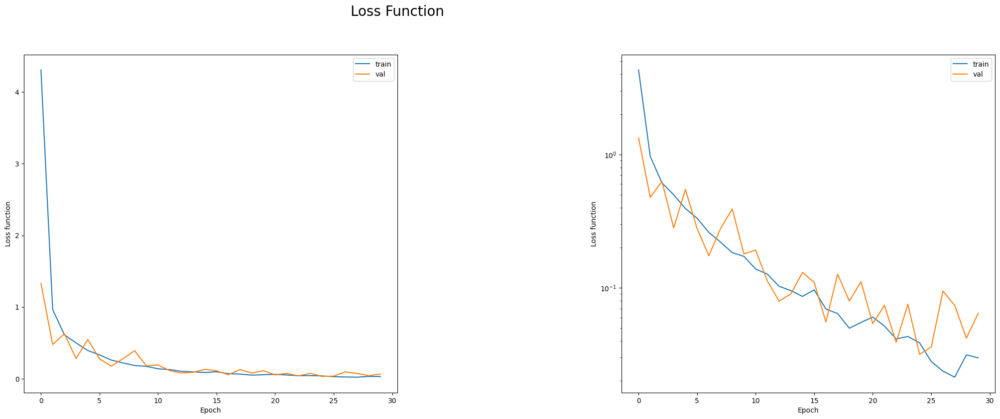

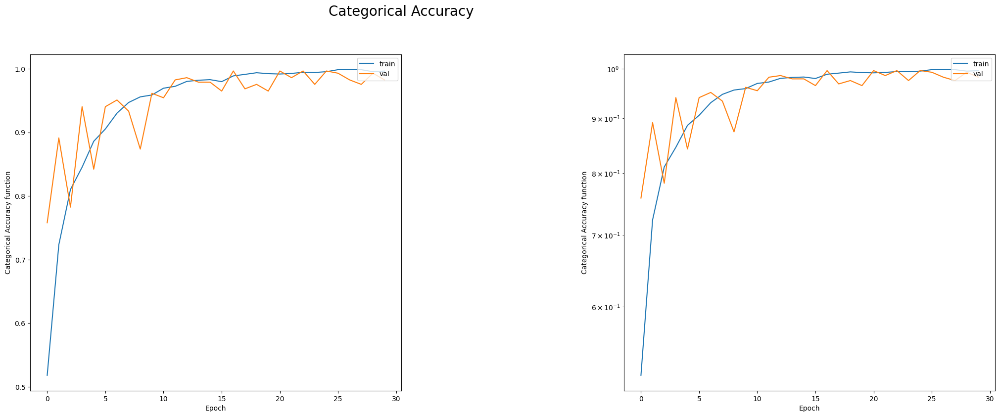

In [23]:
evaluation = model.evaluate(ds_test_norm)
plotTraining(history)
plotTrainingAccuracy(history)

In [24]:
print('Test Dataset Loss:',evaluation[0])
for i, measure in enumerate(metrics):
    print(f'Test Dataset {measure.name}:',evaluation[i+1])

Test Dataset Loss: 0.07889614999294281
Test Dataset categorical_accuracy: 0.9824561476707458
Test Dataset auc: 0.998238742351532


41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step
              precision    recall  f1-score   support

           0       1.00      0.95      0.97       300
           1       0.96      0.98      0.97       306
           2       0.99      1.00      0.99       405
           3       0.98      0.99      0.99       300

    accuracy                           0.98      1311
   macro avg       0.98      0.98      0.98      1311
weighted avg       0.98      0.98      0.98      1311



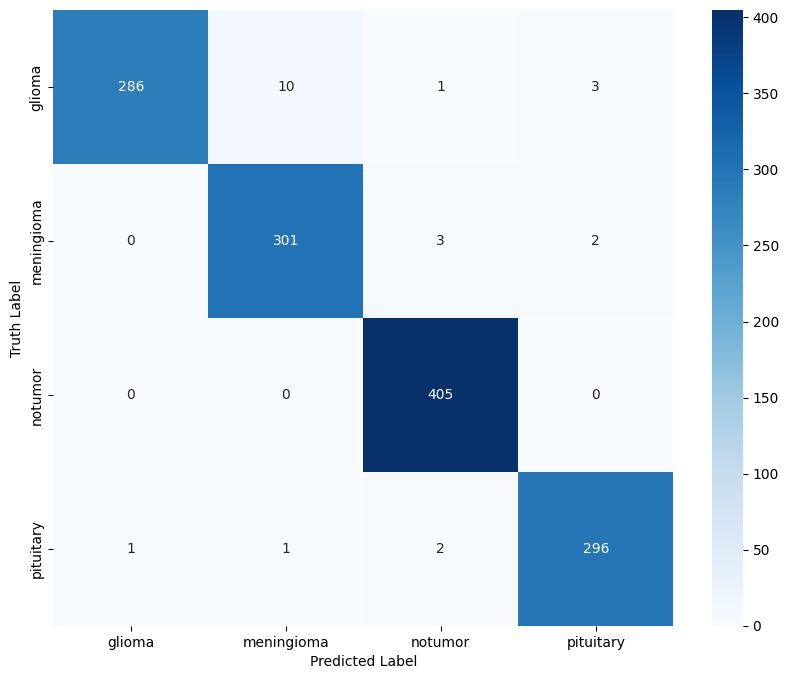

In [25]:
ds_test_cached = ds_test_norm.take(-1).cache()
y = np.argmax(np.array([y.numpy() for x,y in ds_test_cached.unbatch()]), axis=1)
pred = model.predict(ds_test_cached)
y_pred = np.argmax(pred, axis=1)

from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y, y_pred))
cm = confusion_matrix(y, y_pred)
labels = ds_test.class_names
plt.figure(figsize=(10,8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted Label')
plt.ylabel('Truth Label')
plt.show()

In [26]:
import os
import subprocess
from IPython.display import FileLink, display

def download_file(path, download_file_name):
    os.chdir('/kaggle/working/')
    zip_name = f"/kaggle/working/{download_file_name}.zip"
    command = f"zip {zip_name} {path} -r"
    result = subprocess.run(command, shell=True, capture_output=True, text=True)
    if result.returncode != 0:
        print("Unable to run zip command!")
        print(result.stderr)
        return
    display(FileLink(f'{download_file_name}.zip'))

In [27]:
download_file('/kaggle/working', 'out')

/kaggle/working/out.zip